## Download and Preprocess Dataset

First, download [data](https://www.kaggle.com/datasets/pkdarabi/bone-fracture-detection-computer-vision-project/data) and unzip to CWD/datasets/data. Also. create a directory under CWD/datasets/ called data_augmented.

In [109]:
import os
HOME = os.getcwd()
print(HOME)

%cd {HOME}
!python preprocess.py --input_dir {HOME}/datasets/data/ --output_dir {HOME}/datasets/data_aug2/

/home/nayakan1/code/cv_project
/home/nayakan1/code/cv_project


## Install YOLOv8

In [4]:
!pip install ultralytics==8.0.196 --default-timeout=1000

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
Setup complete ✅ (64 CPUs, 125.6 GB RAM, 1458.4/1831.5 GB disk)


In [5]:
from ultralytics import YOLO

from IPython.display import display, Image

## Inference with Non-finetuned Pre-trained Model

In [171]:
%cd {HOME}
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='./datasets/data_augmented/test/images/image2_1700_png.rf.7306d223f39b3350168603a14be008f2.jpg' save=True

/home/nayakan1/code/cv_project
Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/image2_1700_png.rf.7306d223f39b3350168603a14be008f2.jpg: 640x544 1 person, 76.0ms
Speed: 3.1ms preprocess, 76.0ms inference, 275.1ms postprocess per image at shape (1, 3, 640, 544)
Results saved to runs/detect/predict14
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [178]:
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='./datasets/data_augmented/test/images/aug_image1_2257_png.rf.acbb8ed381e14f39b34b50640db90568.jpg' save=True

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

image 1/1 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_image1_2257_png.rf.acbb8ed381e14f39b34b50640db90568.jpg: 640x352 (no detections), 78.2ms
Speed: 2.7ms preprocess, 78.2ms inference, 15.1ms postprocess per image at shape (1, 3, 640, 352)
Results saved to runs/detect/predict15
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [9]:
model = YOLO(f'{HOME}/yolov8n.pt')
results = model.predict(source='/home/nayakan1/code/cv_project/data/test/images/image2_199_png.rf.111ecddb2bdc3542d7f953385d1bb03b.jpg', conf=0.25)


image 1/1 /home/nayakan1/code/cv_project/data/test/images/image2_199_png.rf.111ecddb2bdc3542d7f953385d1bb03b.jpg: 640x480 1 person, 77.4ms
Speed: 3.0ms preprocess, 77.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


In [10]:
results[0].boxes.xyxy

tensor([[  7.0244,   1.3584, 365.4093, 510.5063]], device='cuda:0')

In [11]:
results[0].boxes.conf

tensor([0.2872], device='cuda:0')

In [12]:
results[0].boxes.cls

tensor([0.], device='cuda:0')

## Custom Training

In [55]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8n.pt data=/home/nayakan1/code/cv_project/datasets/data_augmented/data.yaml epochs=100 imgsz=640 plots=True

/home/nayakan1/code/cv_project
Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/nayakan1/code/cv_project/datasets/data_augmented/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, 

In [46]:
!ls {HOME}/runs/detect/train10/

args.yaml					 results.png
confusion_matrix_normalized.png			 train_batch0.jpg
confusion_matrix.png				 train_batch1.jpg
events.out.tfevents.1714337631.mewtwo.3365499.0  train_batch2.jpg
F1_curve.png					 val_batch0_labels.jpg
labels_correlogram.jpg				 val_batch0_pred.jpg
labels.jpg					 val_batch1_labels.jpg
P_curve.png					 val_batch1_pred.jpg
PR_curve.png					 val_batch2_labels.jpg
R_curve.png					 val_batch2_pred.jpg
results.csv					 weights


/home/nayakan1/code/cv_project


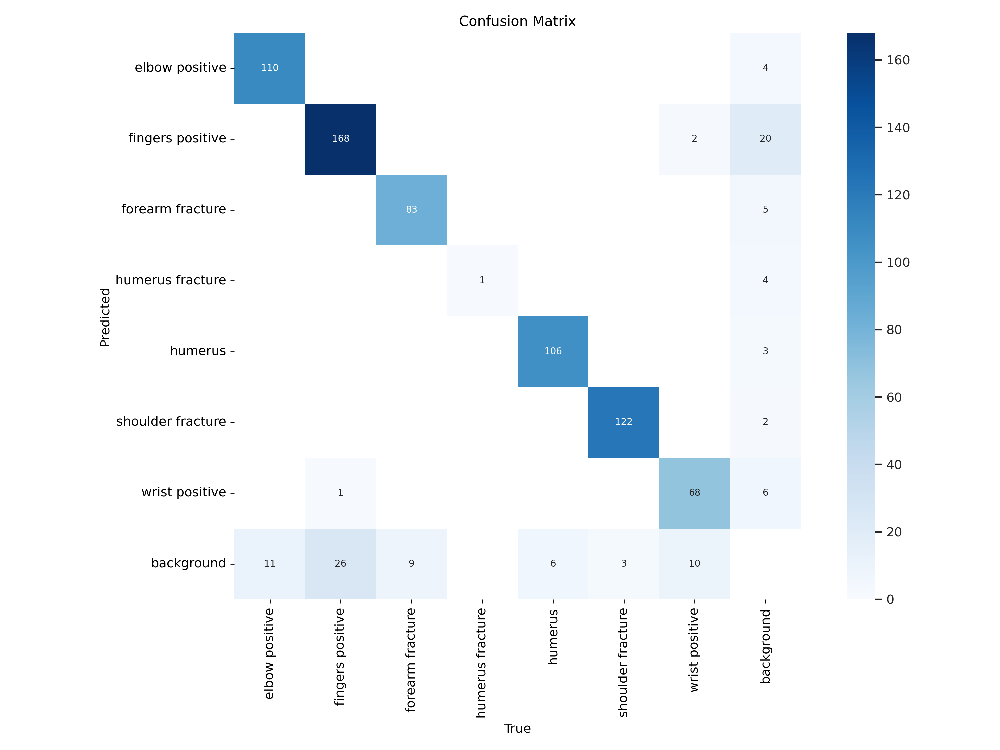

In [56]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train13/confusion_matrix.png', width=600)

/home/nayakan1/code/cv_project


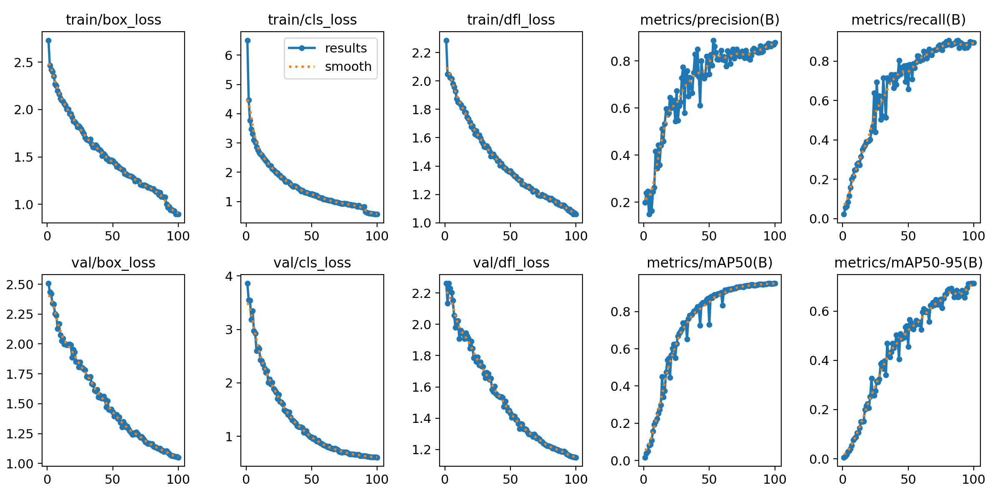

In [58]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train13/results.png', width=600)

/home/nayakan1/code/cv_project


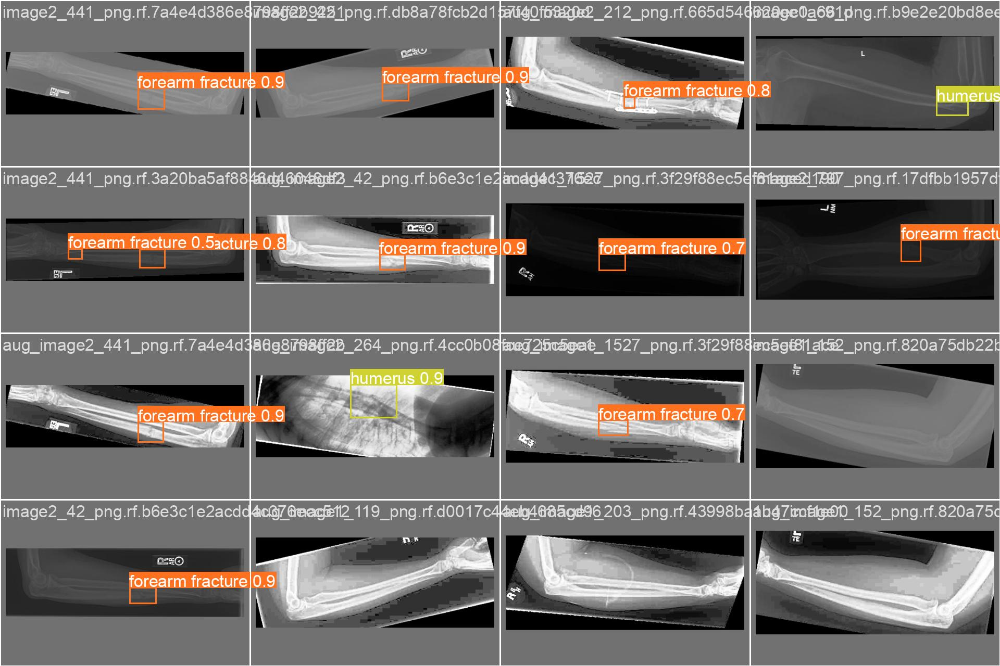

In [59]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train13/val_batch0_pred.jpg', width=600)

## Validate Custom Model

In [66]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train13/weights/best.pt data=/home/nayakan1/code/cv_project/datasets/data_augmented/data.yaml

/home/nayakan1/code/cv_project
Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
Model summary (fused): 168 layers, 3007013 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /home/nayakan1/code/cv_project/datasets/data_augmented/valid/label
                 Class     Images  Instances      Box(P          R      mAP50  m/home/nayakan1/anaconda3/envs/cv/lib/python3.8/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       1245        726      0.868      0.893      0.951      0.711
        elbow positive       1245        121      0.972      0.859      0.948  

## Inference with Custom Model

In [73]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train13/weights/best.pt conf=0.25 source=/home/nayakan1/code/cv_project/datasets/data_augmented/test/images save=True plots=True

/home/nayakan1/code/cv_project
Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
Model summary (fused): 168 layers, 3007013 parameters, 0 gradients, 8.1 GFLOPs

image 1/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_elbow-dislocation-with-coronoid-process-fracture_jpg.rf.234153519323ba2b9aa2e603b0a43771.jpg: 640x640 1 elbow positive, 4.1ms
image 2/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_fracture-of-the-humeral-capitellum-milch-type-1-1-1-_jpg.rf.f40a3ca2a57d511a40839bd1ca615d54.jpg: 512x640 1 elbow positive, 66.5ms
image 3/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_image1_0_png.rf.d29cab92b154a83ca5bf7e40083673a2.jpg: 640x320 1 fingers positive, 65.9ms
image 4/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_image1_1010_png.rf.f89583d2a87e12690f29a1044e4defed.jpg: 640x544 1 humerus, 65.2ms
image 5/1244 /home/nay

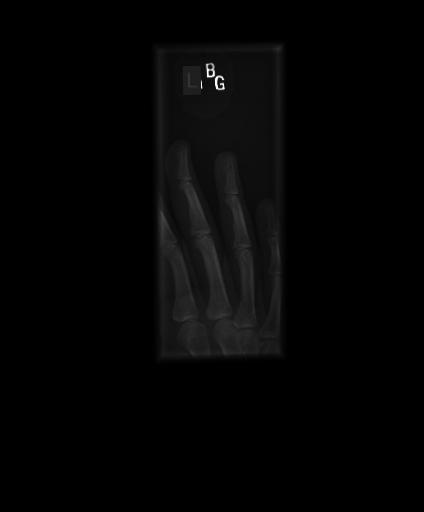

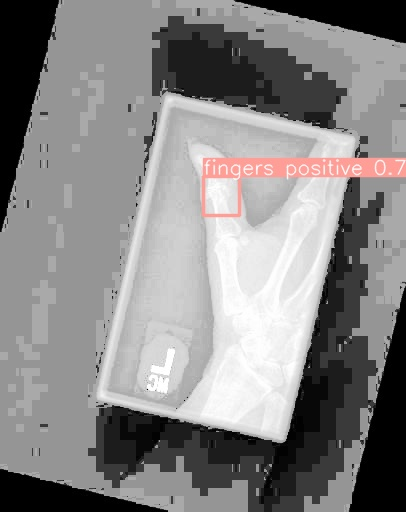

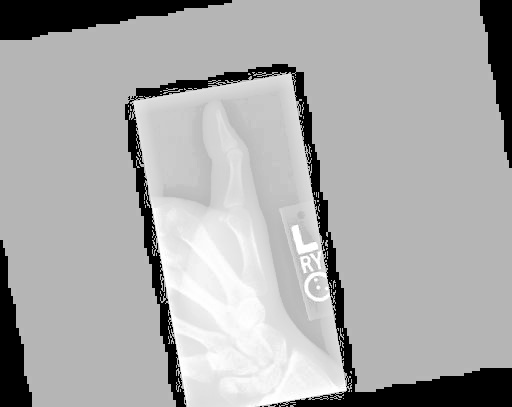

In [68]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict5/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")

## Model Quantizations

In [161]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

class CustomDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = os.listdir(os.path.join(root_dir, "images"))
        self.label_files = os.listdir(os.path.join(root_dir, "labels"))

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        label_name = img_name.replace(".jpg", ".txt")
        img_path = os.path.join(self.root_dir, "images", img_name)
        label_path = os.path.join(self.root_dir, "labels", label_name)

        image = Image.open(img_path).convert("RGB")
        label = self.parse_label(label_path)

        if self.transform:
            image = self.transform(image)

        return image, label

    def parse_label(self, label_path):
        with open(label_path, "r") as file:
            label = file.read().strip()
        return label

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

train_dataset = CustomDataset(root_dir="./datasets/data_aug2/train", transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=8, shuffle=True)


In [162]:
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
import torchvision.transforms as transforms
from torch.quantization import QuantStub, DeQuantStub, fuse_modules, quantize, default_qconfig
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

model_dict = torch.load("./runs/detect/train13/weights/best.pt")
model = model_dict['model'].float()
model.eval()

# transform = transforms.Compose([
#     transforms.ToTensor(),
# ])
# dataset = ImageFolder(root="./datasets/data_aug2/test/images", transform=transform)
# dataloader = DataLoader(dataset, batch_size=8, shuffle=True)

model.qconfig = default_qconfig
# model_prepared = torch.quantization.prepare(model)
# model_prepared.eval()
quantized_model = torch.quantization.quantize_dynamic(model, {torch.nn.Linear}, dtype=torch.qint8)

# with torch.no_grad():
#     for images, _ in train_dataloader:
#         model_prepared(images)

# quantized_model = torch.quantization.convert(model_prepared)

torch.save(quantized_model, "./quantized_yolo_model.pt")


In [163]:
from torchvision.ops import box_iou

test_dataset = CustomDataset(root_dir="./datasets/data_aug2/test", transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=8, shuffle=True)

quantized_model = torch.load("./quantized_yolo_model.pt")
quantized_model.eval()

# device = torch.device("cpu")

# iou_threshold = 0.5
# total_iou = 0
# total_boxes = 0
# total_gt_boxes = 0

# for images, targets in test_dataloader:
#     images = images.to(device)
#     with torch.no_grad():
#         outputs = quantized_model(images)
    
#     for output, target in zip(outputs, targets):
#         output_boxes = output[:, :, 1:]
#         output_scores = output[:, :, 0] 
        
#         for t in target:
#             gt_boxes = t["boxes"]

#             if len(gt_boxes) > 0:
#                 total_gt_boxes += len(gt_boxes)

#                 # Calculate IoU
#                 iou = box_iou(output_boxes, gt_boxes)
#                 max_iou, _ = torch.max(iou, dim=1)
#                 total_iou += torch.sum(max_iou > iou_threshold).item()
        
#         total_boxes += output_boxes.numel() // 4

# precision = total_iou / total_boxes
# recall = total_iou / total_gt_boxes
# mAP = total_iou / len(test_dataset)

# print(f"Precision: {precision}")
# print(f"Recall: {recall}")
# print(f"mAP@0.5: {mAP}")


for images, labels in test_dataloader:
    with torch.no_grad():
        outputs = quantized_model(images)
        print(outputs)

(tensor([[[9.4840e+00, 1.5445e+01, 2.0216e+01,  ..., 1.3859e+02, 1.6969e+02, 2.0197e+02],
         [8.4637e+00, 6.4068e+00, 5.3690e+00,  ..., 1.8750e+02, 1.8565e+02, 1.9015e+02],
         [1.8656e+01, 3.0101e+01, 3.8705e+01,  ..., 7.2360e+01, 8.2179e+01, 5.0383e+01],
         ...,
         [8.4495e-07, 1.0234e-06, 7.0515e-07,  ..., 5.6585e-07, 8.3203e-07, 9.7075e-07],
         [5.5473e-07, 6.8240e-07, 7.1581e-07,  ..., 1.8671e-07, 2.5287e-07, 2.4655e-07],
         [2.0610e-06, 2.0279e-06, 2.8419e-06,  ..., 6.6087e-08, 7.8868e-08, 6.7919e-08]],

        [[5.7338e+00, 1.0019e+01, 1.7524e+01,  ..., 1.4174e+02, 1.7016e+02, 1.9912e+02],
         [5.8828e+00, 4.4292e+00, 4.2141e+00,  ..., 1.6773e+02, 1.7392e+02, 1.8848e+02],
         [1.1148e+01, 1.7667e+01, 2.1987e+01,  ..., 8.5277e+01, 8.0506e+01, 5.7046e+01],
         ...,
         [3.8205e-08, 8.5430e-09, 7.4620e-09,  ..., 1.2741e-07, 1.7665e-07, 1.7273e-07],
         [4.7091e-09, 4.0327e-10, 2.4866e-10,  ..., 3.2807e-08, 3.9463e-08, 3.8

In [104]:
!yolo export model={HOME}/runs/detect/train13/weights/best.pt format=tflite int8=true

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CPU (AMD Ryzen Threadripper PRO 3975WX 32-Cores)
Model summary (fused): 168 layers, 3007013 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/home/nayakan1/code/cv_project/runs/detect/train13/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 11, 8400) (5.9 MB)

TensorFlow SavedModel: starting export with tensorflow 2.13.1...

ONNX: starting export with onnx 1.16.0 opset 17...
ONNX: simplifying with onnxsim 0.4.36...
ONNX: export success ✅ 0.7s, saved as '/home/nayakan1/code/cv_project/runs/detect/train13/weights/best.onnx' (11.6 MB)
TensorFlow SavedModel: running 'onnx2tf -i "/home/nayakan1/code/cv_project/runs/detect/train13/weights/best.onnx" -o "/home/nayakan1/code/cv_project/runs/detect/train13/weights/best_saved_model" -nuo --verbosity info -oiqt -qt per-tensor'

Automatic generation of each OP name started ========================================
Automatic generation of each OP na

In [106]:
!yolo val task=detect model=/home/nayakan1/code/cv_project/runs/detect/train13/weights/best_saved_model/best_float32.tflite imgsz=640 data=/home/nayakan1/code/cv_project/datasets/data_augmented/data_test.yaml int8 device='cpu'

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CPU (AMD Ryzen Threadripper PRO 3975WX 32-Cores)
Loading /home/nayakan1/code/cv_project/runs/detect/train13/weights/best_saved_model/best_int8.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
Forcing batch=1 square inference (1,3,640,640) for non-PyTorch models
val: Scanning /home/nayakan1/code/cv_project/datasets/data_augmented/test/labels
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       1244        696      0.875      0.842      0.916      0.654
        elbow positive       1244        114      0.953      0.888      0.936      0.685
      fingers positive       1244        159       0.93      0.752      0.864      0.527
      forearm fracture       1244        129      0.933      0.757      0.882      0.618
      humerus fracture       1244          1      0.438          1      0.995      0.796
               humerus   

In [108]:
!yolo val task=detect model=/home/nayakan1/code/cv_project/runs/detect/train13/weights/best_saved_model/best_int8.tflite imgsz=640 data=/home/nayakan1/code/cv_project/datasets/data_augmented/data_test.yaml device='cpu'

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CPU (AMD Ryzen Threadripper PRO 3975WX 32-Cores)
Loading /home/nayakan1/code/cv_project/runs/detect/train13/weights/best_saved_model/best_float32.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
Forcing batch=1 square inference (1,3,640,640) for non-PyTorch models
val: Scanning /home/nayakan1/code/cv_project/datasets/data_augmented/test/labels
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       1244        696      0.879      0.886      0.943      0.712
        elbow positive       1244        114      0.956      0.877      0.946      0.727
      fingers positive       1244        159      0.957      0.839      0.906      0.591
      forearm fracture       1244        129      0.931      0.832      0.919      0.665
      humerus fracture       1244          1      0.411          1      0.995      0.895
               humerus

In [168]:
!yolo export model={HOME}/runs/detect/train13/weights/best.pt format=openvino data=/home/nayakan1/code/cv_project/datasets/data_augmented/data.yaml int8=true device=0

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
Model summary (fused): 168 layers, 3007013 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/home/nayakan1/code/cv_project/runs/detect/train13/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 11, 8400) (5.9 MB)

ONNX: starting export with onnx 1.16.0 opset 17...
ONNX: export success ✅ 0.4s, saved as '/home/nayakan1/code/cv_project/runs/detect/train13/weights/best.onnx' (11.7 MB)

OpenVINO: starting export with openvino 2024.1.0-15008-f4afc983258-releases/2024/1...
INFO:nncf:NNCF initialized successfully. Supported frameworks detected: torch, tensorflow, onnx, openvino
OpenVINO: collecting INT8 calibration images from 'data=/home/nayakan1/code/cv_project/datasets/data_augmented/data.yaml'
Scanning /home/nayakan1/code/cv_project/datasets/data_augmented/valid/labels.cac
INFO:nncf:6 ignored nodes were found by types in the NNCFGraph
INFO:nncf:Not 

In [169]:
!yolo val task=detect model=/home/nayakan1/code/cv_project/runs/detect/train13/weights/best_int8_openvino_model imgsz=640 data=/home/nayakan1/code/cv_project/datasets/data_augmented/data_test.yaml int8 device='cpu'

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CPU (AMD Ryzen Threadripper PRO 3975WX 32-Cores)
Loading /home/nayakan1/code/cv_project/runs/detect/train13/weights/best_int8_openvino_model for OpenVINO inference...
Forcing batch=1 square inference (1,3,640,640) for non-PyTorch models
val: Scanning /home/nayakan1/code/cv_project/datasets/data_augmented/test/labels
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       1244        696      0.935      0.709      0.921       0.65
        elbow positive       1244        114      0.958      0.895      0.935      0.657
      fingers positive       1244        159      0.875      0.751      0.863      0.508
      forearm fracture       1244        129      0.901       0.85       0.91      0.616
      humerus fracture       1244          1          1          0      0.995      0.895
               humerus       1244        116      0.972      0.895      0.979      0.673
     sho

In [170]:
!yolo predict task=detect model=/home/nayakan1/code/cv_project/runs/detect/train13/weights/best_int8_openvino_model imgsz=640 int8 conf=0.25 source=/home/nayakan1/code/cv_project/datasets/data_augmented/test/images save=True plots=True

Ultralytics YOLOv8.0.196 🚀 Python-3.8.19 torch-2.3.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24257MiB)
Loading /home/nayakan1/code/cv_project/runs/detect/train13/weights/best_int8_openvino_model for OpenVINO inference...

image 1/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_elbow-dislocation-with-coronoid-process-fracture_jpg.rf.234153519323ba2b9aa2e603b0a43771.jpg: 640x640 1 elbow positive, 12.0ms
image 2/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_fracture-of-the-humeral-capitellum-milch-type-1-1-1-_jpg.rf.f40a3ca2a57d511a40839bd1ca615d54.jpg: 640x640 1 elbow positive, 10.4ms
image 3/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_image1_0_png.rf.d29cab92b154a83ca5bf7e40083673a2.jpg: 640x640 1 fingers positive, 9.4ms
image 4/1244 /home/nayakan1/code/cv_project/datasets/data_augmented/test/images/aug_image1_1010_png.rf.f89583d2a87e12690f29a1044e4defed.jpg: 640x640 1 humerus, 6.9ms
image 5/1244 /h